# Random Processes in Meteorology

Done by Dmytro Zhuk for "MODERN RESEARCH IN WORLD SCIENCE" scientific conference in Lviv, Ukraine.                  
- Conference source: https://sci-conf.com.ua/ix-mizhnarodna-naukovo-praktichna-konferentsiya-modern-research-in-world-science-28-30-11-2022-lviv-ukrayina/
- Data source: https://www.ncdc.noaa.gov/cdo-web/

Climate change is the observed and projected long-term changes in average climate, as well as climate variability, caused by human activity, including such anomalies as droughts, severe storms and floods.

The climate of our planet has been constantly changing throughout the entire geological history of the Earth, and these changes were accompanied by significant fluctuations in average global temperatures. One of the main drivers of global average temperature change is the burning of fossil fuels, coal, gas and oil, which has increased the concentration of greenhouse gases such as carbon dioxide in our atmosphere.

The use of temperature prediction models is of great practical importance, starting from predicting the temperature for the next year for sowing, crop yields, etc. Everything directly helps to solve the problem of hunger on a global scale.


The data is:
- STATION - Number of the certain station
- NAME - Name of the certain station
- LATITUDE, LONGITUDE - Latitude, Longitude
- DATE - Date
- TAVG - Average Temperature
- TMAX - Maximum temperature
- TMIN - Minimum temperature
- PRCP - Precipitation
- SNWD - Snow depth

## EDA

In [1]:
import pandas as pd # Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import DecomposeResult, seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import warnings 
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("citydata.csv") # Read the data

In [3]:
df.head(5) # View first 5 instances

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,SNWD,TAVG,TMAX,TMIN
0,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-03-26,NaN,NaN,NaN,NaN,12.6
1,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-25,NaN,NaN,NaN,21.0,NaN
2,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-26,NaN,NaN,NaN,23.1,12.6
3,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-27,NaN,NaN,23.1,23.0,11.5
4,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-28,NaN,NaN,23.0,24.4,15.3


In [4]:
df.shape # Shape of the data

(24884, 11)

In [5]:
df.info() # View info about DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24884 entries, 0 to 24883
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   STATION    24884 non-null  object 
 1   NAME       24884 non-null  object 
 2   LATITUDE   24884 non-null  float64
 3   LONGITUDE  24884 non-null  float64
 4   ELEVATION  24884 non-null  float64
 5   DATE       24884 non-null  object 
 6   PRCP       8825 non-null   float64
 7   SNWD       2468 non-null   float64
 8   TAVG       22698 non-null  float64
 9   TMAX       13534 non-null  float64
 10  TMIN       12332 non-null  float64
dtypes: float64(8), object(3)
memory usage: 2.1+ MB


In [6]:
df.describe() # Describe DataFrame

,LATITUDE,LONGITUDE,ELEVATION,PRCP,SNWD,TAVG,TMAX,TMIN
count,24884.000000,24884.000000,24884.000000,8825.000000,2468.000000,22698.000000,13534.000000,12332.000000
mean,50.391401,30.678729,129.332744,2.399127,120.184765,8.748498,13.378077,4.697389
std,0.077932,0.284881,48.803056,6.259729,127.966285,9.986619,11.164683,8.962894
min,50.333000,30.100000,0.000000,0.000000,10.000000,-26.500000,-21.700000,-43.000000
25%,50.333000,30.533100,122.000000,0.000000,30.000000,1.000000,3.800000,-1.400000
50%,50.400000,30.533100,122.000000,0.200000,79.000000,8.900000,14.000000,4.700000
75%,50.400000,30.967000,166.000000,2.200000,180.000000,17.200000,22.800000,12.200000
max,50.600000,30.967000,166.000000,255.000000,2230.000000,36.200000,94.600000,26.800000


In [7]:
df.columns # Columns 

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'PRCP',
       'SNWD', 'TAVG', 'TMAX', 'TMIN'],
      dtype='object')

In [8]:
df.isnull().sum() # Check how many missing values do we have

STATION          0
NAME             0
LATITUDE         0
LONGITUDE        0
ELEVATION        0
DATE             0
PRCP         16059
SNWD         22416
TAVG          2186
TMAX         11350
TMIN         12552
dtype: int64

In [9]:
df["DATE"] = pd.to_datetime(df["DATE"]) # Convert object to datetime 

In [10]:
df["NAME"].value_counts() # Show unique instances of each stations 

KIEV, UP          11345
BORYSPIL, UP      10943
NEMESHAEVO, UP     2596
Name: NAME, dtype: int64

In [11]:
df1 = df[df["NAME"] == "KIEV, UP"] # Three separate stations - three separate DataFrame, reset indexes 
df2 = df[df["NAME"] == "BORYSPIL, UP"]
df3 = df[df["NAME"] == "NEMESHAEVO, UP"]
df1 = df1.reset_index(drop = "True")
df2 = df2.reset_index(drop = "True")
df3 = df3.reset_index(drop = "True")

In [12]:
df1.head() # KIEV, UP station

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,SNWD,TAVG,TMAX,TMIN
0,UPM00033345,"KIEV, UP",50.4,30.5331,166.0,1991-01-01,0.0,NaN,0.6,2.5,-0.8
1,UPM00033345,"KIEV, UP",50.4,30.5331,166.0,1991-01-02,4.7,30.0,0.5,1.5,-0.8
2,UPM00033345,"KIEV, UP",50.4,30.5331,166.0,1991-01-03,4.3,30.0,0.4,3.6,-0.6
3,UPM00033345,"KIEV, UP",50.4,30.5331,166.0,1991-01-04,0.0,20.0,2.1,4.0,0.3
4,UPM00033345,"KIEV, UP",50.4,30.5331,166.0,1991-01-05,2.1,NaN,3.5,4.7,1.6


In [13]:
df2.head() # BORYSPIL, UP station

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,SNWD,TAVG,TMAX,TMIN
0,UPM00033347,"BORYSPIL, UP",50.333,30.967,122.0,1991-01-08,NaN,NaN,1.6,NaN,NaN
1,UPM00033347,"BORYSPIL, UP",50.333,30.967,122.0,1991-01-09,NaN,NaN,0.4,NaN,NaN
2,UPM00033347,"BORYSPIL, UP",50.333,30.967,122.0,1991-01-10,NaN,NaN,1.4,NaN,NaN
3,UPM00033347,"BORYSPIL, UP",50.333,30.967,122.0,1991-01-11,NaN,NaN,6.4,NaN,NaN
4,UPM00033347,"BORYSPIL, UP",50.333,30.967,122.0,1991-01-12,NaN,NaN,5.2,NaN,NaN


In [14]:
df3.head() # NEMESHAEVO, UP station

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,SNWD,TAVG,TMAX,TMIN
0,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-03-26,NaN,NaN,NaN,NaN,12.6
1,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-25,NaN,NaN,NaN,21.0,NaN
2,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-26,NaN,NaN,NaN,23.1,12.6
3,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-27,NaN,NaN,23.1,23.0,11.5
4,UPM00033342,"NEMESHAEVO, UP",50.6,30.1,0.0,2000-04-28,NaN,NaN,23.0,24.4,15.3


In [15]:
temp1 = pd.Series(data=df1["TAVG"].to_list(), index=df1["DATE"].to_list()) # KIEV, UP, temperature average

In [16]:
temp1.head()

1991-01-01    0.6
1991-01-02    0.5
1991-01-03    0.4
1991-01-04    2.1
1991-01-05    3.5
dtype: float64

In [17]:
temp2 = pd.Series(data=df2["TAVG"].to_list(), index=df2["DATE"].to_list()) # BORYSPIL, UP, temperature average

In [18]:
temp3 = pd.Series(data=df3["TAVG"].to_list(), index=df3["DATE"].to_list()) # NEMESHAEVO, UP, temperature average

Let's plot those processes, drop NaN values, build trend lines using Ordinary Least Squares to see whether processes are stationary or not.

In [19]:
temp1 = temp1.dropna()
temp2 = temp2.dropna()
temp3 = temp3.dropna()

In [20]:
for i in [[temp1, "KIEV, UP"], [temp2, "BORYSPIL, UP"], [temp3, "NEMESHAEVO, UP"]]: # Show time series of three stations, drop NaN values
    fig = px.scatter(i[0], x = i[0].index, y = i[0].values, title = i[1], trendline="ols", trendline_color_override="red")
    fig.update_layout({
                    "xaxis": {"title":"Time"},
                    "yaxis": {"title":"Temperature AVG"}
                     })
    fig.show()

Let's check stationarity of the time series using Dickey-Fuller test and p-value. If p-value is smaller than 0.05, then the null hypothesis (reject non-stationarity) will be rejected and this particular time series will be stationary. Othervice, it will not be stationary.   

In [21]:
adf, pval, usedlag, nobs, crit_vals, icbest =  adfuller(temp1.values) # KIEV, UP station
print('ADF test statistic:', adf)
print('ADF p-values:', pval)
print('ADF number of lags used:', usedlag)
print('ADF number of observations:', nobs)
print('ADF critical values:', crit_vals)
print('ADF best information criterion:', icbest)

ADF test statistic: -7.814145099346631
ADF p-values: 6.942206731164266e-12
ADF number of lags used: 40
ADF number of observations: 11275
ADF critical values: {'1%': -3.4309301143596738, '5%': -2.861796379231577, '10%': -2.5669064655552334}
ADF best information criterion: 52077.163820151254


In [22]:
adf, pval, usedlag, nobs, crit_vals, icbest =  adfuller(temp2.values) # BORYSPIL, UP station
print('ADF test statistic:', adf)
print('ADF p-values:', pval)
print('ADF number of lags used:', usedlag)
print('ADF number of observations:', nobs)
print('ADF critical values:', crit_vals)
print('ADF best information criterion:', icbest)

ADF test statistic: -7.752913154242219
ADF p-values: 9.91031944752788e-12
ADF number of lags used: 39
ADF number of observations: 10902
ADF critical values: {'1%': -3.4309499670139245, '5%': -2.8618051521469448, '10%': -2.5669111353567367}
ADF best information criterion: 51982.25663392912


In [23]:
adf, pval, usedlag, nobs, crit_vals, icbest =  adfuller(temp3.values) # NEMESHAEVO, UP station
print('ADF test statistic:', adf)
print('ADF p-values:', pval)
print('ADF number of lags used:', usedlag)
print('ADF number of observations:', nobs)
print('ADF critical values:', crit_vals)
print('ADF best information criterion:', icbest)

ADF test statistic: -2.8267475129688497
ADF p-values: 0.054553482945667635
ADF number of lags used: 3
ADF number of observations: 436
ADF critical values: {'1%': -3.445437655635993, '5%': -2.8681918844944785, '10%': -2.5703132171113543}
ADF best information criterion: 2378.713320634922


So, there are 3 time series - random processes with a discrete-time observation. 
As we can see, the first 2 processes have clear stationarity over the years. 
The last one has too much missing values and is non-stationary, though can't be described accurately in terms of seasonality and to be predicted upon. 

## Time Series decomposition

The basic approach to seasonal decomposition splits the time series into three components: trend, seasonal and residuals.
- the trend component is calculated as a centered moving average of the original series,
- the seasonal component is calculated as the per period average of the detrended series,
- the residual component (noise) is obtained after removing the trend and seasonal components from the time series.

Let’s assume that we have 2 additive models, that is, consisting of a linear trend and seasonal cycle with the same frequency and amplitude. Let's plot seasonal and residual components. 

In [24]:
fig = make_subplots(rows=2, cols=3, subplot_titles=("KIEV, UP", "KIEV, UP", "KIEV, UP", "BORYSPIL, UP", "BORYSPIL, UP", "BORYSPIL, UP"))

fig.add_trace(go.Scatter(x = temp1.loc["1995"].index, y =  temp1.loc["1995"].values ), row=1, col=1)
fig.add_trace(go.Scatter(x = temp1.loc["2005"].index, y =  temp1.loc["2005"].values ), row=1, col=2)
fig.add_trace(go.Scatter(x = temp1.loc["2015"].index, y =  temp1.loc["2015"].values ), row=1, col=3)

fig.add_trace(go.Scatter(x = temp2.loc["1995"].index, y =  temp2.loc["1995"].values ), row=2, col=1)
fig.add_trace(go.Scatter(x = temp2.loc["2005"].index, y =  temp2.loc["2005"].values ), row=2, col=2)
fig.add_trace(go.Scatter(x = temp2.loc["2015"].index, y =  temp2.loc["2015"].values ), row=2, col=3)

fig.update_layout(title = "Seasonal aspect of observations")
fig.show()

As we can see, all observations have similiar seasonal structures (starting with low average temperature at the beginning of the year in winter --> in spring average temperature is increasingly rising --> summer is the peak of year temperature --> autumn average temperature is decreasing --> ending with low temperature). 

Let's plot the residual component over the 1 year's period.  

In [25]:
def plot_seasonal_decompose(result:DecomposeResult, dates:pd.Series=None, title:str="Residual aspect of observations"):
    x_values = dates if dates is not None else np.arange(len(result.observed))
    return (
        make_subplots(
            rows=1,
            cols=1,
            subplot_titles=[title],
        )
        .add_trace(
            go.Scatter(x=x_values, y=result.resid, mode="lines", name='Residual'),
            row=1,
            col=1,
        )
        .update_layout(
            height=400, title=f'<b>{title}</b>', margin={'t':100}, title_x=0.5, showlegend=False
        )
    )

In [26]:
decomposition = seasonal_decompose(temp1.values, model='additive', period=365)
fig = plot_seasonal_decompose(decomposition, dates=temp1.index, title="KIEV, UP")
fig.update_layout(title = "Residual aspect of observations")
fig.show()

In [27]:
decomposition = seasonal_decompose(temp2.values, model='additive', period=365)
fig = plot_seasonal_decompose(decomposition, dates=temp2.index, title="BORYSPIL, UP")
fig.update_layout(title = "Residual aspect of observations")
fig.show()

The residuals are interesting, showing periods of high variability, especially in the approx. 2005-2008 years.

## Time series models 

### Types of time series models

- Classical time series models

Classical time series models are a family of models that have been traditionally used a lot in many domains of forecasting. They are strongly based on temporal variation inside a time series and they work well with univariate time series. These models are generally only applicable to time series and are not useful for other types of machine learning.

- Supervised models

Supervised models are a family of models that are used for many machine learning task. A machine learning model is supervised when it uses clearly defined input variables and one or more output (target) variables. Supervised models can be used for time series, as long there is a way to extract seasonality and put it into a variable. 

List of the models: 
1. Exponential smoothing, Holt-Whinter's method;
2. Prophet (is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects).

In [28]:
from sklearn.model_selection import train_test_split, cross_val_score # Import all necessary libraries for ML, DL and Classical models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet import Prophet

#### Exponential smoothing, Holt-Winter's method

Plot the ACF and PACF plots.

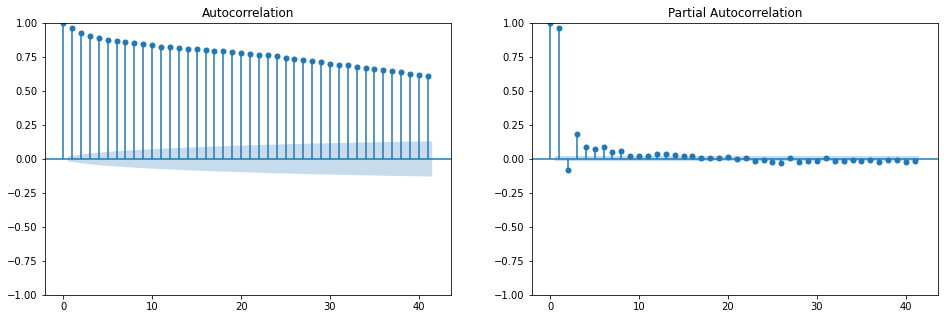

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
plot_acf(temp1, ax=axes[0])
plot_pacf(temp1, ax=axes[1])
plt.show()

In [30]:
m = 12 # 12 month
alpha = 1/(2*m)
temp1HWES1 = SimpleExpSmoothing(temp1.values).fit(smoothing_level = alpha,optimized = False,use_brute = True).fittedvalues
temp1HWES2_ADD = ExponentialSmoothing(temp1.values, trend = "add").fit().fittedvalues # Double exponential smoothing for additive models
temp1HWES3_ADD = ExponentialSmoothing(temp1.values, trend = "add", seasonal = "add", seasonal_periods = 12).fit().fittedvalues

In [31]:
temp1HWES3_ADD[:365]

array([  0.61279402,   0.28637839,   0.27179567,   0.13165162,
         2.00141459,   3.15833233,   0.3937405 ,   1.83102938,
         3.16960986,   2.33470946,   1.42661184,   7.22589173,
         6.6953559 ,   3.15495709,  -2.35794564,  -4.13459206,
        -5.62805502,  -3.38010412,  -4.35737177,  -3.90351987,
        -5.30066864,  -6.69465383,  -4.46407868,  -0.97689702,
        -0.03735809,  -1.42655498,   1.46825474,  -5.31906625,
        -9.22370278,  -4.29056543, -11.57296469, -19.61708835,
       -17.21162679, -12.6709789 , -12.19927536, -14.69060668,
       -16.90363289, -14.21817995, -12.10910487,  -7.71002501,
       -10.26822749,  -9.16074719,  -6.15622273,  -2.74025192,
        -0.59992333,  -0.9359251 ,  -3.700982  ,  -5.96516752,
        -5.64427495,  -3.34262295,  -4.53567735,  -3.00414731,
        -1.85703711,  -0.67345916,  -1.99396855,  -3.61362241,
         1.09064785,   2.31973708,   0.81640991,  -0.60344201,
        -1.76869163,  -3.1539859 ,  -5.80137829,  -4.73

In [32]:
trace1 = go.Scatter( # Single and double Holt-Winter's exponential smoothing 
    x = temp1.index,
    y = temp1.values,
    marker = dict(color = 'rgb(34,163,192)'))

trace2 = go.Scatter(
    x = temp1.index,
    y = temp1HWES1,
    yaxis = 'y2')

trace3 = go.Scatter(
    x = temp1.index,
    y = temp1HWES2_ADD,
    yaxis = 'y3')

fig = make_subplots(specs = [[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2, secondary_y = True)
fig.add_trace(trace3, secondary_y = True)
fig['layout'].update(title = "KIEV, UP, HWES1, HWES2", xaxis = dict(tickangle = -90))
fig.show()

In [33]:
trace1 = go.Scatter( # Tripple Holt-Winter's exponential smoothing, looks much better --> captures the seasonality and stationarity better
    x = temp1.index,
    y = temp1.values,
    marker = dict(color = 'rgb(34,163,192)'))

trace2 = go.Scatter(
    x = temp1.index,
    y = temp1HWES3_ADD,
    yaxis = 'y2')

fig = make_subplots(specs = [[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2, secondary_y = True)
fig['layout'].update(title = "KIEV, UP, HWES3", xaxis = dict(tickangle = -90))
fig.show()

Let's predict with tripple exponential smoothing. 

In [34]:
model1 = ExponentialSmoothing(temp1.values, trend = "add", seasonal = "add", seasonal_periods = 12).fit()

In [35]:
test_predictions = model1.predict(1)
data = test_predictions[:365] # Predict the data for 1 year
index = pd.date_range(start = '01-01-2023', end = '12-31-2023', freq='D')

In [36]:
trace1 = go.Scatter(
    x = temp1.index,
    y = temp1.values[:11150])

trace2 = go.Scatter(
    x = index,
    y = data,
    marker = dict(color = 'rgb(34,163,192)'))

fig = make_subplots(specs = [[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2)
fig['layout'].update(title = "KIEV, UP, HWES3_ADD, Prediction", xaxis = dict(tickangle = -90))
fig.show()

Model HWES3_ADD is very similar to the initial data. Let's evaluate this model.

In [37]:
test_predictions = model1.predict(1)
data = test_predictions[:365] # Predict the data for 1 year
index = pd.date_range(start = '01-01-1992', end = '12-31-1992', freq='D')

trace1 = go.Scatter(
    x = temp1.index[365:730],
    y = temp1.values[365:730])

trace2 = go.Scatter(
    x = index,
    y = data,
    marker = dict(color = 'rgb(34,163,192)'))

fig = make_subplots(specs = [[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2)
fig['layout'].update(title = "KIEV, UP, HWES3_ADD, Prediction", xaxis = dict(tickangle = -90))
fig.show()

In [38]:
mean_squared_error(temp1.values[365:730], data) # MSE

26.316476334574727

In [39]:
mean_absolute_error(temp1.values[365:730], data) # MAE

4.036518487071952

In [40]:
r2_score(temp1.values[365:730], data) # R^2

0.7024258165900131

#### Prophet model

In [41]:
model2 = Prophet() # Fit the data in a model, the type of the model is "Black-Box" 
d = {"ds": temp1.index, "y": temp1.values}
temp1p = pd.DataFrame(data = d)
model2.fit(temp1p)

10:07:09 - cmdstanpy - INFO - Chain [1] start processing
10:07:21 - cmdstanpy - INFO - Chain [1] done processing


In [42]:
future = model2.make_future_dataframe(periods=365)
future.head(5)

,ds
0,1991-01-01
1,1991-01-02
2,1991-01-03
3,1991-01-04
4,1991-01-05


In [43]:
future.tail(5)

,ds
11676,2023-08-22
11677,2023-08-23
11678,2023-08-24
11679,2023-08-25
11680,2023-08-26


In [44]:
forecast = model2.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
11676,2023-08-22,20.596556,15.292807,25.931069
11677,2023-08-23,20.373456,14.757625,25.460558
11678,2023-08-24,20.302646,14.691922,25.377592
11679,2023-08-25,20.098644,14.686803,25.246769
11680,2023-08-26,19.836782,14.453936,25.066958


In [45]:
trace1 = go.Scatter(
    x = temp1.index,
    y = temp1.values,
    marker = dict(color = 'rgb(34,163,192)'))

trace2 = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat"],
    yaxis='y2')

fig = make_subplots(specs = [[{"secondary_y": True}]])
fig.add_trace(trace1)
fig.add_trace(trace2, secondary_y=True)
fig['layout'].update(title = "KIEV, UP, Prophet", xaxis = dict(tickangle = -90))
fig.show()

In [46]:
mean_squared_error(temp1.values, forecast.iloc[0:11316]["yhat"].values) # MSE

17.296278436536348

In [47]:
mean_absolute_error(temp1.values, forecast.iloc[0:11316]["yhat"].values) # MAE

3.296445347214469

In [48]:
r2_score(temp1.values, forecast.iloc[0:11316]["yhat"].values) # R^2

0.8233631153055813

# Summary

As a result of the work done, several conclusions can be drawn: 
- Prophet library has higher R^2 score and lower MSE, MAE respectively. Despite Prophet being half-black box model, it predicts pretty well using Supervised methods - the model captures generalization of the data as well as seasonality and stationarity.
- Using models of classical time series prediction (for example, Exponential smoothing, Holt-Whinter's method), supervised machine learning (Prophet), it becomes possible to scale them, forecast for long periods of time.
- With the help of these models, it is possible to process and predict different types of data, such as: temperature, precipitation level, snow depth. Also, forecasts can be used for versatile purposes of human activities.
